<a href="https://colab.research.google.com/github/wagnerde/ISCC_Shivdasani/blob/main/ISCC_Shivdasani2022_analysis_220614_sample1_WholeMes_SInt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ISCC Shivdasani 2022: Analysis
Analyze cNMF spectra calculated for: <br>
**sample1-WholeMes_SInt** <br>

## Environment Setup (220614)
Install software from pip, apt, and Github.  Load modules, configure workspace settings.

In [ ]:
# Environment Setup: verified working on 220614

# print python version to screen
!python --version

# pip install software
!pip install -q scanpy==1.8.2 bbknn==1.5.1 leidenalg==0.8.10 scrublet==0.2.3 wget==3.2 
!pip install -q pyyaml==5.3.1 fastcluster==1.1.26 cnmf==1.3.2

# apt-get install software
!sudo apt-get install -qq lftp

# import python packages
import os, sys, wget, pickle
import bbknn
import scrublet as scr
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# import helper functions from Github
if not os.path.exists('scTools-py'): 
  !git clone https://github.com/wagnerde/scTools-py.git
sys.path.append('scTools-py/')
import scTools_dew as dew

Python 3.7.13
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
Cloning into 'scTools-py'...
remote: Enumerating objects: 287, done.
remote: Counting objects: 100% (144/144), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 287 (delta 112), reused 115 (delta 85), pack-reused 143
Receiving objects: 100% (287/287), 74.21 KiB | 8.25 MiB/s, done.
Resolving deltas: 100% (175/175), done.


## Download Preprocessed Data from Box

In [ ]:
# wget files from static Box link 
!wget -q --show-progress https://ucsf.box.com/shared/static/cisy8wc7g6ftw7fovlw5lp3n73w5zosw.h5ad -O 220501_sample1-WholeMes_SInt.h5ad
!wget -q --show-progress https://ucsf.box.com/shared/static/dgz8u8v700io2gfkxhwjgydpkpxprtli.gz -O 220501_sample1-WholeMes_SInt.cNMF.tar.gz
!tar -xzf /content/220501_sample1-WholeMes_SInt.cNMF.tar.gz

# move cNMF output back to its "normal" location
!mv /content/content/cNMF-output/ /content/

220501_sample1-Whol 100%[===================>] 347.97M  27.1MB/s    in 14s     
220501_sample1-Whol 100%[===================>] 404.62M  19.5MB/s    in 22s     


## Run ScanPy

### Read in the dataset


In [ ]:
adata = sc.read('220501_sample1-WholeMes_SInt.h5ad')

### Process and Normalize

In [ ]:
adata.layers['raw_nolog'] = adata.X.copy()
adata.layers['raw'] = np.log1p(adata.X.copy())
sc.pp.filter_cells(adata, min_genes=250)
sc.pp.normalize_total(adata, target_sum=1e6, inplace=True) # TPM Normalization
adata.layers['tpm_nolog'] = adata.X.copy()
sc.pp.log1p(adata)
adata.layers['tpm'] = adata.X.copy()
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
sc.pp.scale(adata)

### Compute Embeddings and Perform Clustering

In [ ]:
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=50)
sc.tl.umap(adata)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


In [ ]:
sc.tl.leiden(adata, resolution=0.1) # default resolution = 1

### Plot Embeddings

In [ ]:
sc.set_figure_params(dpi=120, figsize=[4,4], dpi_save=300, fontsize=10)
!mkdir -p figures/
sample_name_prefix = '220316-s1-WholeMesSInt'

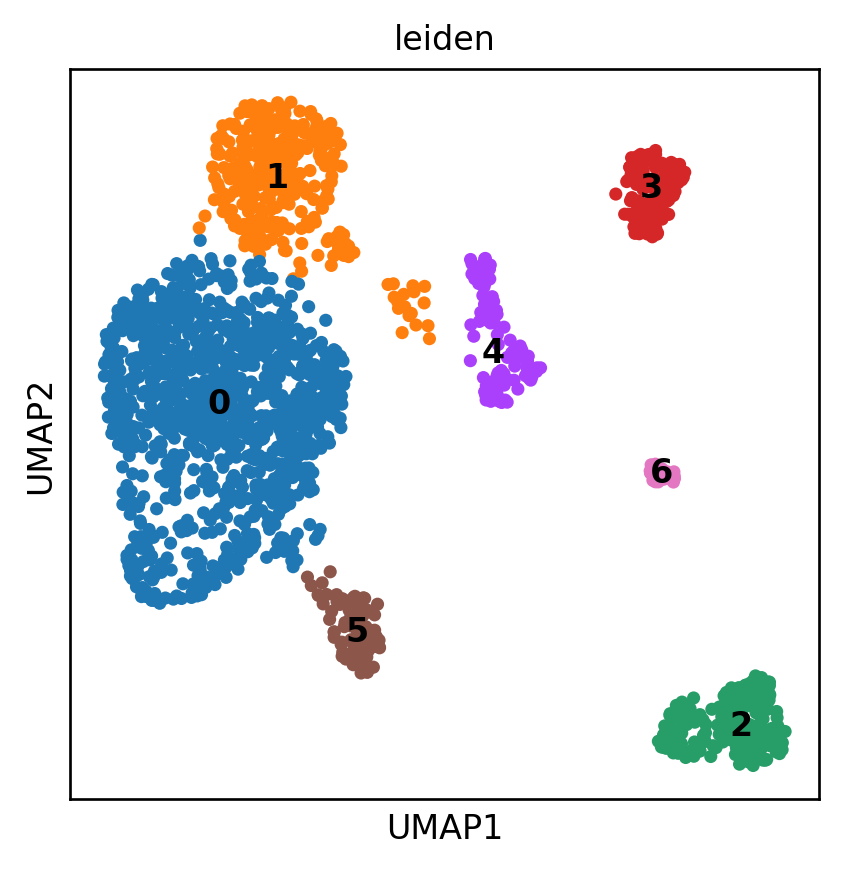

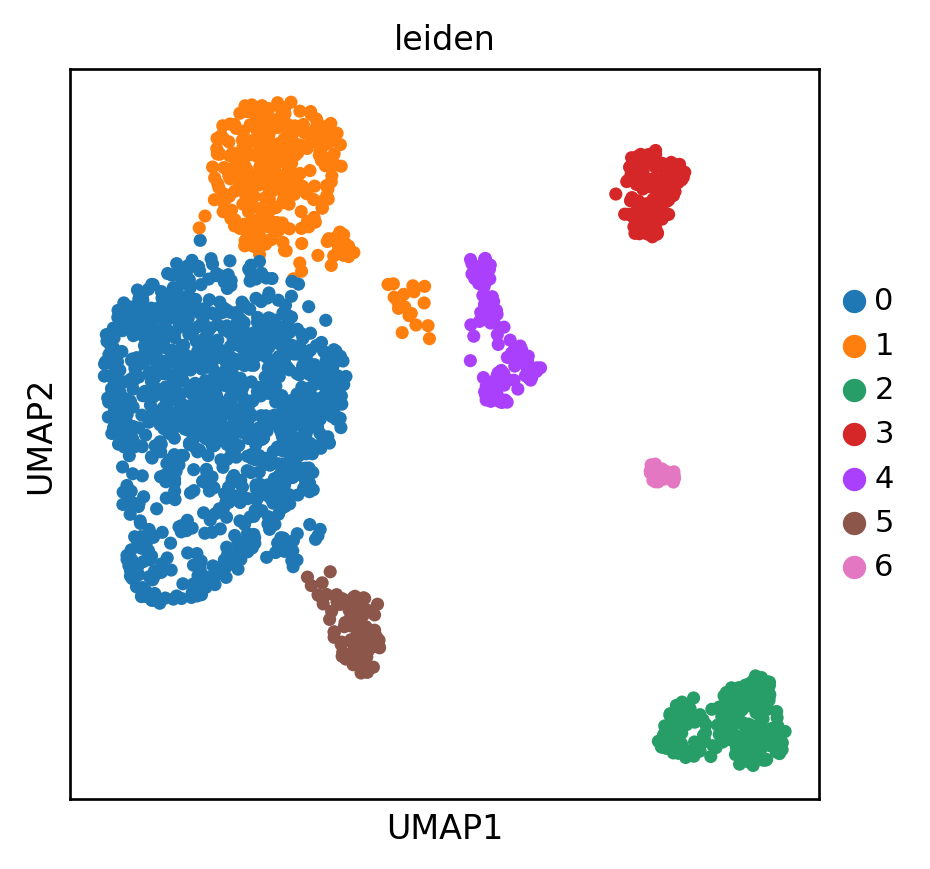

In [ ]:
# Inspect the UMAP plot - overlay with the results of the leiden clustering algorithm
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', save='_'+sample_name_prefix+'.leiden.pdf')
sc.pl.umap(adata, color=['leiden'], save='_'+sample_name_prefix+'.leiden.legend.pdf')

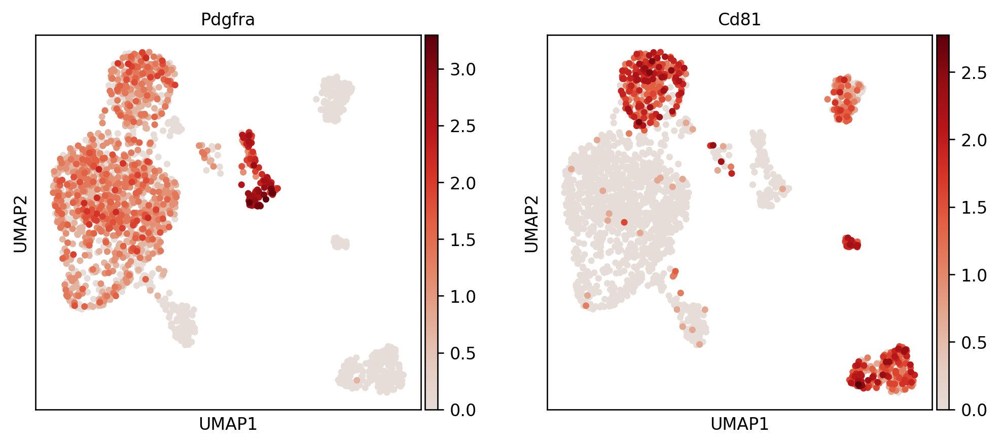

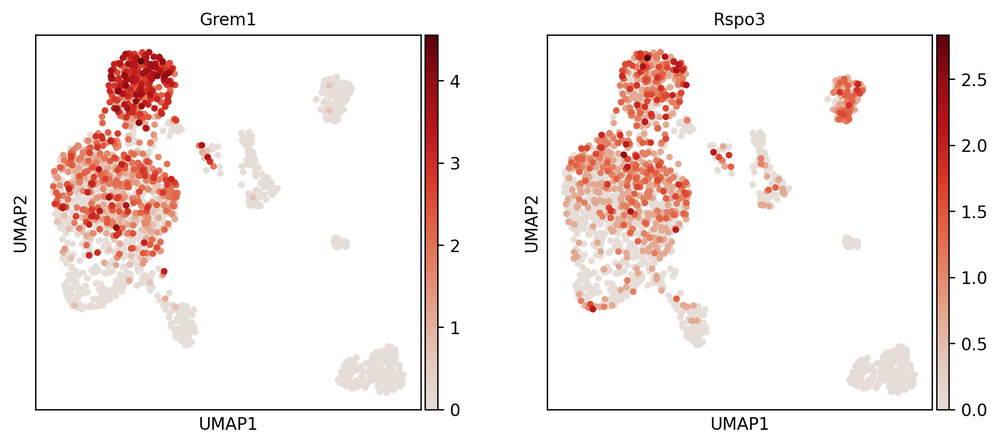

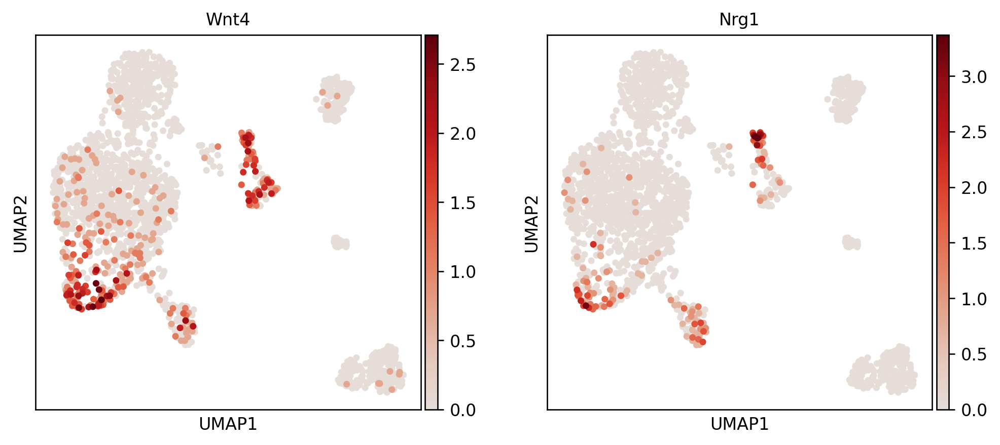

In [ ]:
# Overlay with a few marker genes
sc.pl.umap(adata, color=['Pdgfra','Cd81'], layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))
sc.pl.umap(adata, color=['Grem1','Rspo3'], layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))
sc.pl.umap(adata, color=['Wnt4','Nrg1'], layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))

### Identify Differentially Expressed Genes

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden', layer='raw', use_raw=False, reference='rest', n_genes=100, method='wilcoxon', 
                        corr_method='benjamini-hochberg', log_transformed=True, key_added='rank_genes_groups')

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


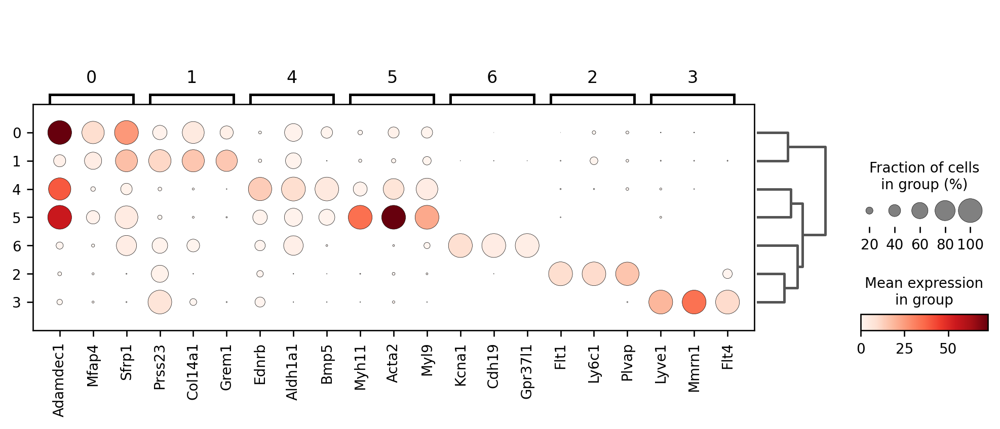

In [ ]:
sc.tl.dendrogram(adata, groupby='leiden')
sc.pl.rank_genes_groups_dotplot(adata, n_genes=3, groupby='leiden');

### Overlay cNMF Gene Expression Programs (GEPs)

In [ ]:
# cNMF settings (modify as needed)
cNMF_k = 22
cNMF_density_thresh = 0.20
cNMF_local_neighborhood_size = 0.3

# Load cNMF usage matrix into AnnData
usage_path = '/content/cNMF-output/Shiv2022-cNMF/Shiv2022-cNMF.usages.k_22.dt_0_2.consensus.txt'
usage_matrix = pd.read_csv(usage_path, sep='\t', index_col=0)
usage_matrix.columns = ['GEP_%s' % i for i in usage_matrix.columns]
usage_matrix = usage_matrix.div(usage_matrix.sum(axis=1), axis=0)
for x in usage_matrix.columns:
  adata.obs[x] = usage_matrix[x].tolist()

In [ ]:
# Obtain the top z-scored genes for each GEP
n_top_genes = 2000

gene_scores_path = '/content/cNMF-output/Shiv2022-cNMF/Shiv2022-cNMF.spectra.k_22.dt_0_2.consensus.txt'
gene_scores = pd.read_csv(gene_scores_path, sep='\t', index_col=0).T

top_genes = []
for gep in gene_scores.columns:
    top_genes.append(list(gene_scores.sort_values(by=gep, ascending=False).index[:n_top_genes]))    
top_genes = pd.DataFrame(top_genes, index=usage_matrix.columns).T
top_genes.to_csv('sample1-WholeMes_SInt_GEPtopgenes.csv')

pd.options.display.max_columns=None
pd.options.display.max_rows=30

top_genes

,GEP_1,GEP_2,GEP_3,GEP_4,GEP_5,GEP_6,GEP_7,GEP_8,GEP_9,GEP_10,GEP_11,GEP_12,GEP_13,GEP_14,GEP_15,GEP_16,GEP_17,GEP_18,GEP_19,GEP_20,GEP_21,GEP_22
0,Crip1,Slfn5,Ncam1,Mmrn1,Junb,Il22,Isg15,Notch3,Aldh1a1,Kcna1,Myl6,Igkc,Enpp6,Fabp4,Cxcl14,Tnfrsf18,Lum,Ednrb,H2-D1,Slc6a6,Trdc,Fos
1,Mfap5,Noct,Sfrp1,Cavin2,Egr1,Gpr183,Ifit3,Ndufa4l2,Pdgfra,Chl1,Acta2,Jchain,Gja5,Plvap,P2rx1,Ccr5,Prss23,Glp2r,H2-K1,Ssu2,Miat,Ubb
2,Cd248,Upp1,Ltbp1,Lyve1,Ccnl1,Il2rb,Ifit3b,Vtn,Trp53i11,Plp1,Tagln,Iglv1,Ace,Thrsp,Mmp10,Ptprc,Aebp1,Adamts18,Ifitm3,Dusp26,Acpp,Jun
3,Anxa2,Bcr,Ltbp4,Reln,Nr4a1,Slc38a1,Ifit1,Cox4i2,Abcc9,Cdh19,Tpm2,Mzb1,Kcne3,Cd36,Fgfr2,Gzma,Grem1,Fgf9,Ces1d,Msx1,Trdv4,Dusp1
4,S100a6,Csf2rb,Rarres2,Aqp1,Zfp36,Il7r,Gbp7,Ano1,Sox6,Ank3,Myh11,Igha,Sema3g,Ehd4,Tmem176b,Gzmb,Col14a1,Col6a4,Ifitm1,Gcnt1,Cd163l1,Fosb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,Tm6sf1,Sh2d5,Sigirr,Gm26740,Nav2,Plekha7,Lsr,Itgax,Tm6sf1,Gvin1,Cd163l1,Myo7a,Lyve1,Ntn1,AI467606,AI467606,Ptpre,Myo7a,Pde2a,Col6a4,Tnfaip8l3,Tnnt1
1996,Sv2b,Alpl,Olfr60,Cited2,E2f8,Sox6,Nfkbid,Gm49368,Gm44812,Trim30a,Ebf3,Thrsp,Adm,Nr4a3,Kif22,Kif22,Cpxm2,Thrsp,P2ry2,Cxcl9,Acsbg1,2810474O19Rik
1997,Gm44812,Wnt4,Cd163l1,Adgrg6,Dbp,Insc,Gmfg,AI467606,1700112J16Rik,Olfr78,Ptpre,Fzd4,Olfr78,Pax5,Cdiptos,Cdiptos,Fgfr2,Prss23,Plekhb1,Areg,Cyp1a1,Abcc9
1998,Aldh1a3,Cilp,Ebf3,Samd5,Mamstr,Calca,Zfp36,Kif22,Apba2,Olfr558,Itgax,Sh3gl3,Olfr558,Tpm2,Fam57b,Fam57b,Itgax,Fzd4,Kcne3,Ereg,Tcf23,Kcnj8


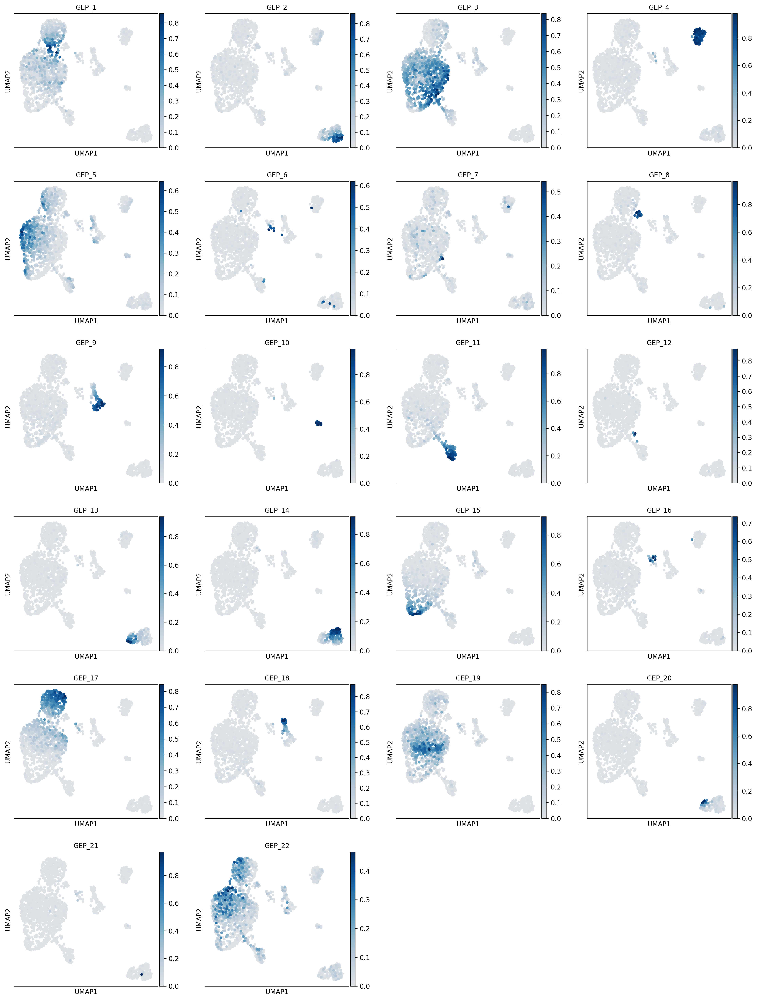

In [ ]:
# Plot the UMAP with GEP scores  
sc.pl.umap(adata, color=usage_matrix.columns, save='_'+sample_name_prefix+'.all.gep.pdf', cmap=dew.darken_cmap(plt.cm.Blues, 0.9))

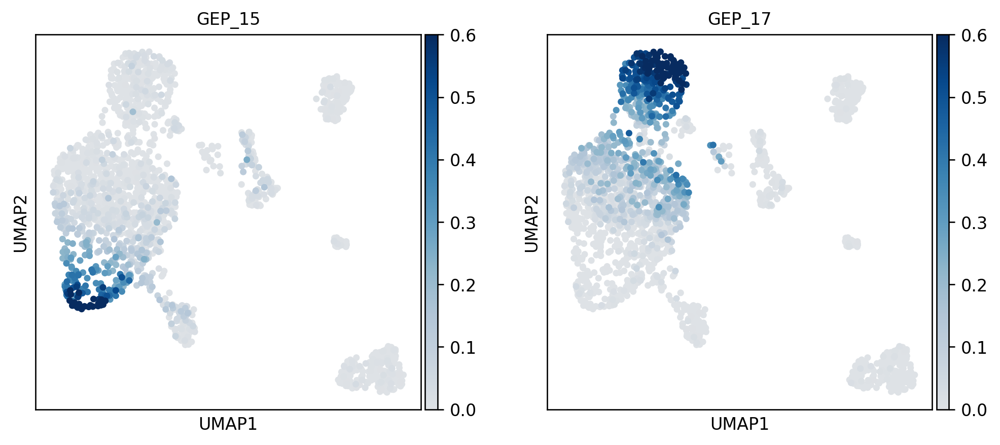

In [ ]:
# Plot the UMAP with GEP scores  
#sc.pl.umap(adata, color=['GEP_15','GEP_17'], save='_'+sample_name_prefix+'.gep15+17_reds.pdf', cmap=dew.darken_cmap(plt.cm.Reds, 0.9), vmin=0, vmax=0.6)
sc.pl.umap(adata, color=['GEP_15','GEP_17'], save='_'+sample_name_prefix+'.gep15+17.pdf', cmap=dew.darken_cmap(plt.cm.Blues, 0.9), vmin=0, vmax=0.6)
#sc.pl.umap(adata, color=['GEP_15','GEP_17'], save='_'+sample_name_prefix+'.gep15+17_jet.pdf', cmap='jet')
#sc.pl.umap(adata, color=['GEP_15','GEP_17'], save='_'+sample_name_prefix+'.gep15+17_viridis.pdf', cmap='viridis')
#sc.pl.umap(adata, color=['GEP_15','GEP_17'], save='_'+sample_name_prefix+'.gep15+17_OrRd.pdf', cmap=dew.darken_cmap(plt.cm.OrRd, 0.9), vmin=0, vmax=0.6)

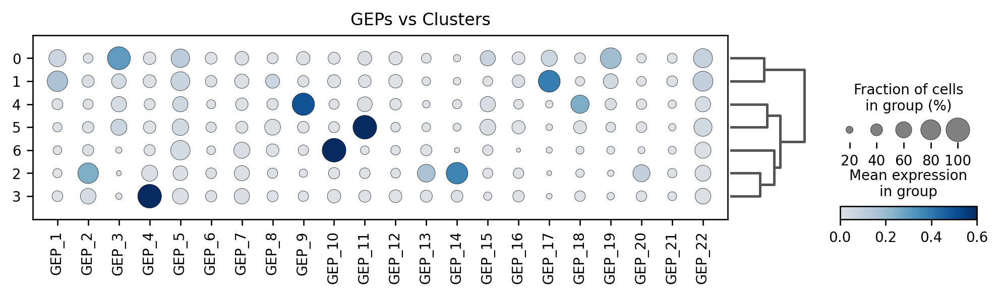

In [ ]:
# Confirm GEP specificity with dot plots
sc.pl.dotplot(adata, usage_matrix.columns, groupby='leiden', dendrogram=True, layer='raw', 
              title='GEPs vs Clusters', figsize=[10,2],
              save=sample_name_prefix+'.gep-vs-leiden-dotplot.pdf', cmap=dew.darken_cmap(plt.cm.Blues, 0.9), vmin=0, vmax=0.6)

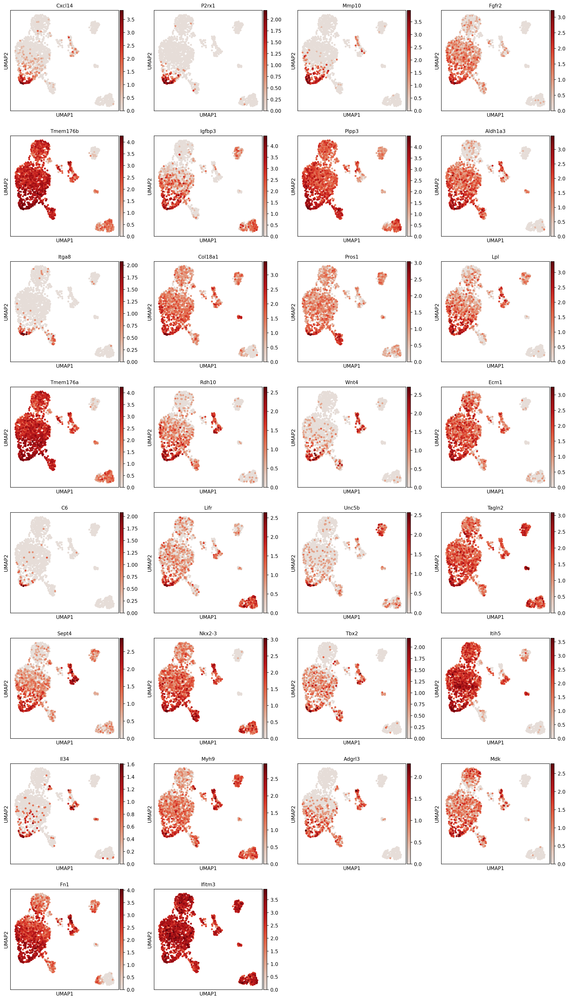

In [ ]:
# Overlay the top 30 genes from GEP15 (Wnt4 is ranked #15) 
sc.pl.umap(adata, color=top_genes['GEP_15'][0:30].tolist(), ncols=4, layer='raw', save='_'+sample_name_prefix+'.gep15.30genes.pdf', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))

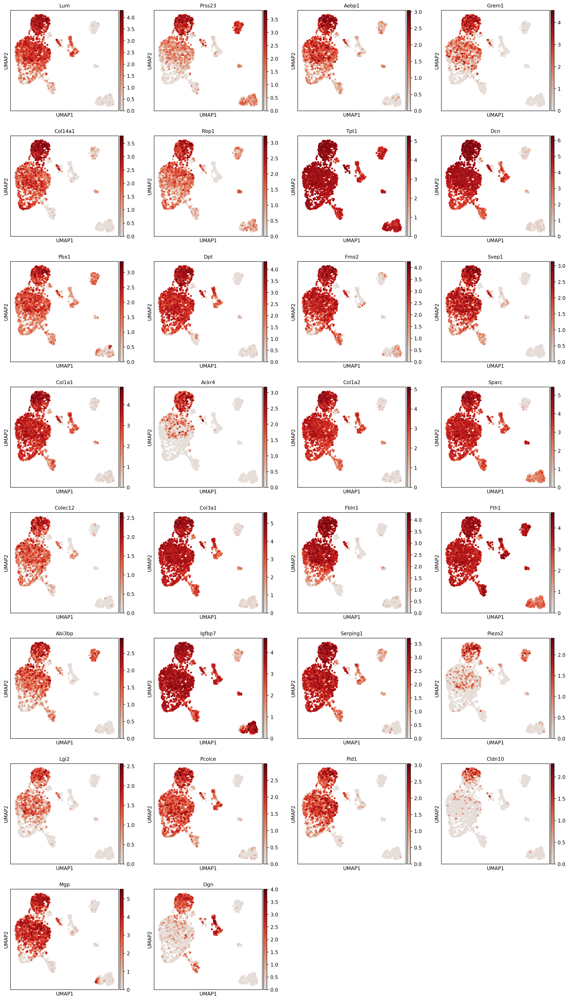

In [ ]:
# Overlay the top 30 genes from GEP17 (Grem1 is ranked #4) 
sc.pl.umap(adata, color=top_genes['GEP_17'][0:30].tolist(), ncols=4, layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9), save='_'+sample_name_prefix+'.gep17.30genes.pdf')

### Plot GEPs VS Pseudotime


In [ ]:
# subset the continuum of cell states encompassing leiden clusters 0 & 1
flag = np.in1d(adata.obs['leiden'],['0','1'])
adata_sub = adata[flag,:]

In [ ]:
# select a root cell at random from leiden cluster 1
adata_sub.uns['iroot'] = np.flatnonzero(adata_sub.obs['leiden'] == '1')[4]

/usr/local/lib/python3.7/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/usr/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


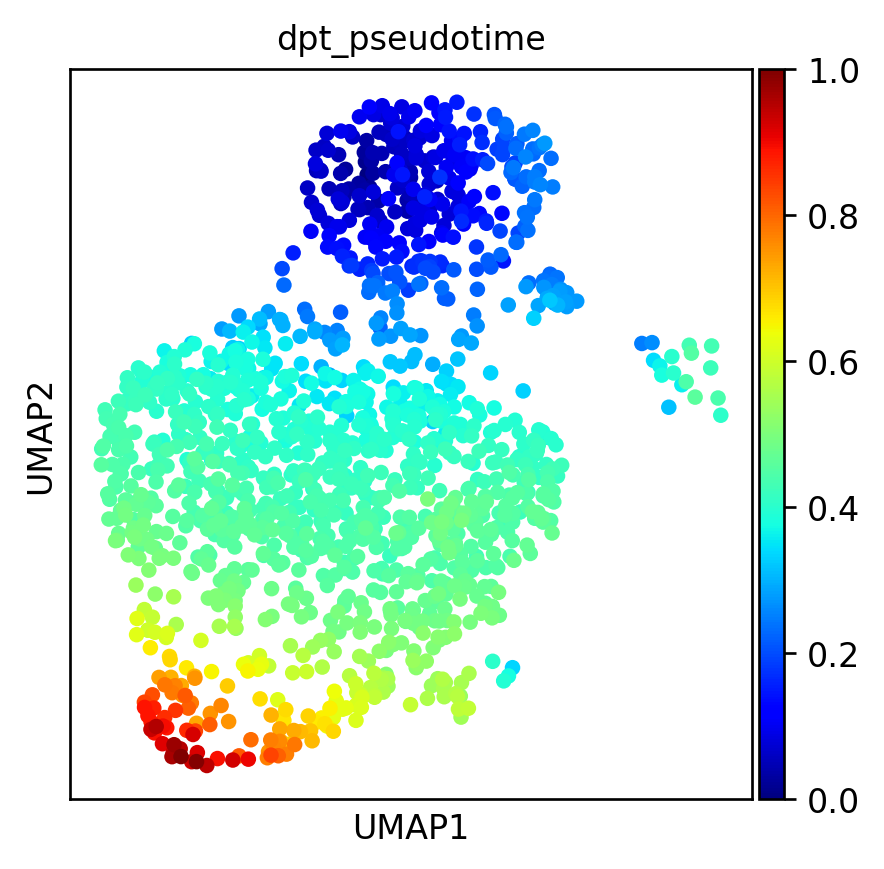

In [ ]:
# compute & plot pseudotime values
sc.tl.diffmap(adata_sub)
sc.tl.dpt(adata_sub)
sc.pl.umap(adata_sub, color =['dpt_pseudotime'], cmap='jet', save='_'+sample_name_prefix+'.pseudotime.pdf')

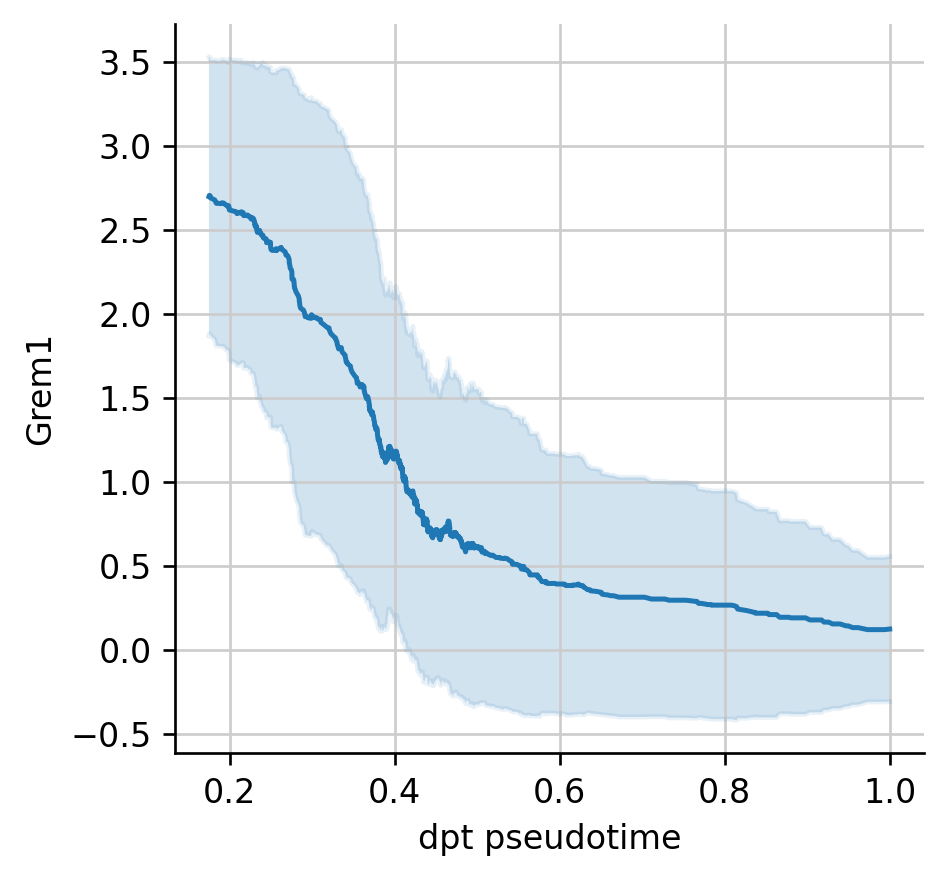

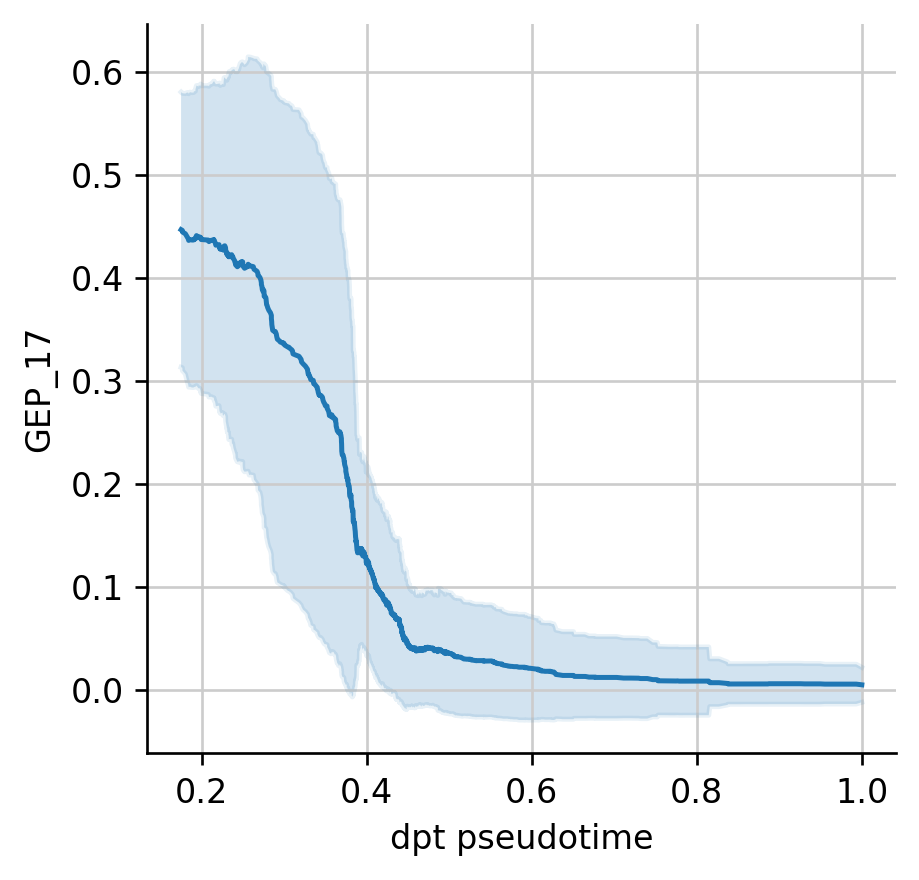

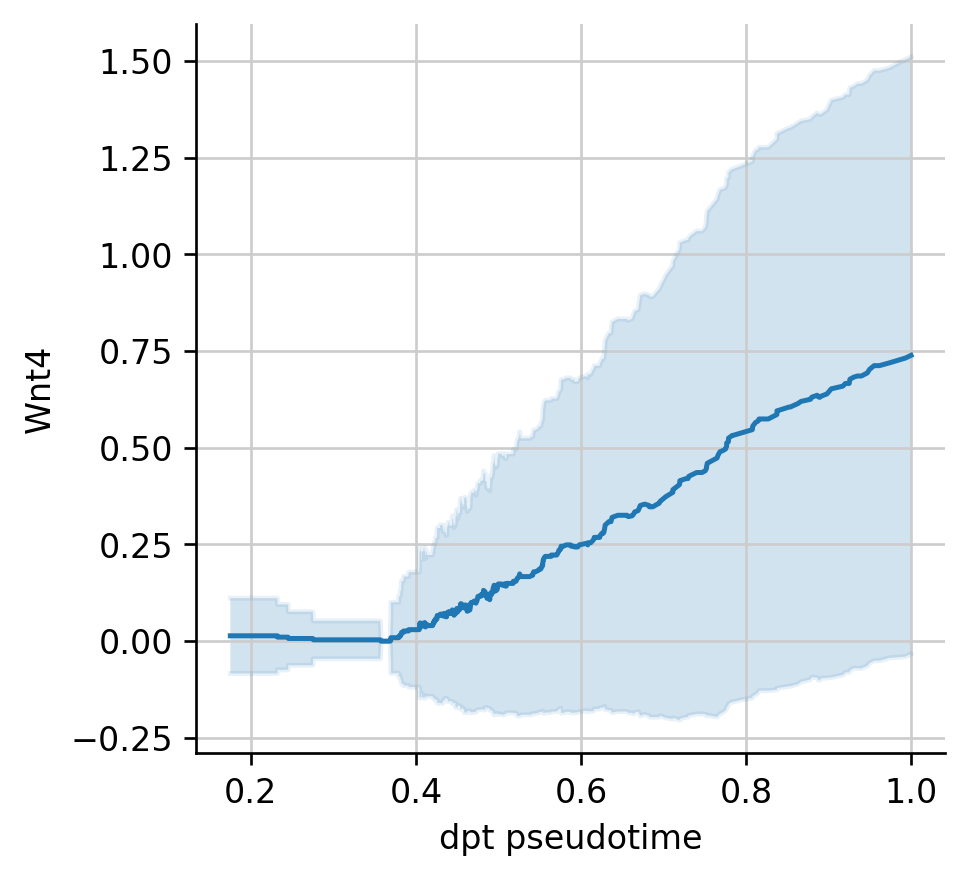

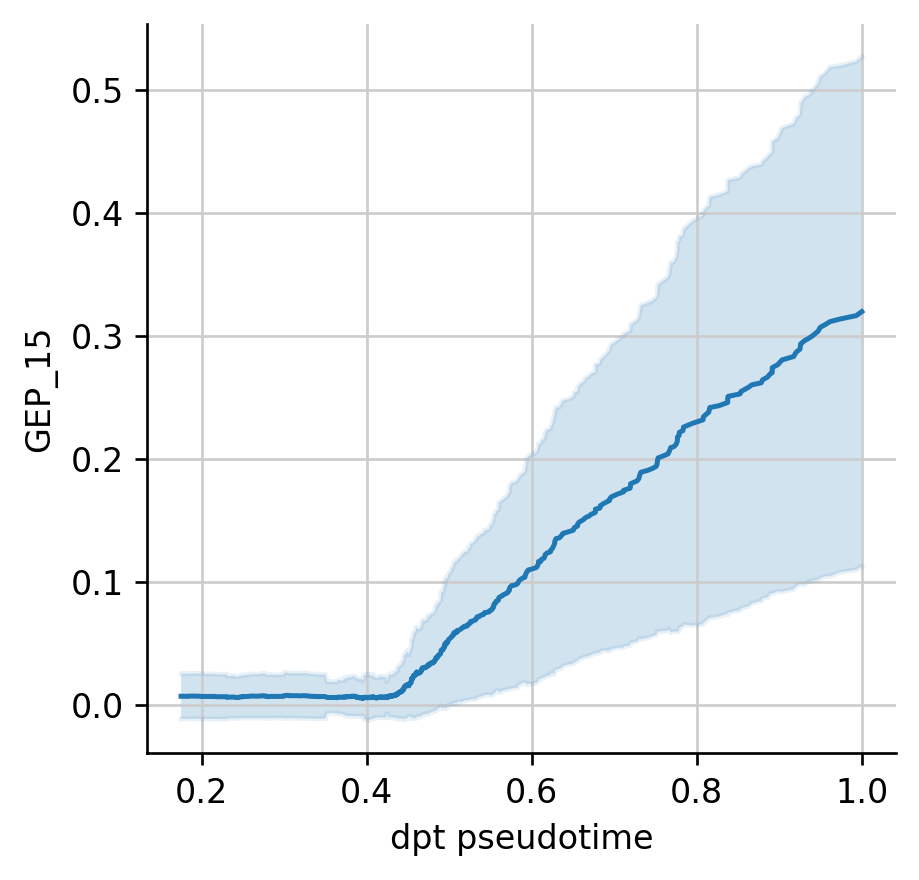

In [ ]:
# plot the pseudotime trajectories for genes & GEPs
dew.plot_dpt_trajectory(adata_sub, 'Grem1', sliding_window=200, save='_'+sample_name_prefix+'.Grem1.pdf')
dew.plot_dpt_trajectory(adata_sub, 'GEP_17', sliding_window=200, save='_'+sample_name_prefix+'.gep17.pdf')

dew.plot_dpt_trajectory(adata_sub, 'Wnt4', sliding_window=200, save='_'+sample_name_prefix+'.Wnt4.pdf')
dew.plot_dpt_trajectory(adata_sub, 'GEP_15', sliding_window=200, save='_'+sample_name_prefix+'.gep15.pdf')
